<a href="https://colab.research.google.com/github/chrsthper/PBA_Christhoper-Pangaribuan-NBA_App/blob/main/NBA_APP_Analysis_PBA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Scrap and Sentiment Analysis of NBA Reviews App

### CHRISTHOPER CARLOS PANGARIBUAN
### 5026221150


# ====================================================
# Install and Import All Required Libraries
- Ensure necessary packages like textblob, seaborn, nltk, etc. are available.
- Install using pip if not already installed.
# ====================================================

In [ ]:
!pip install google_play_scraper
!pip install textblob
!pip install seaborn

from google_play_scraper import app, Sort, reviews_all
import pandas as pd
import numpy as np
import sklearn
import requests
import matplotlib.pyplot as plt
import matplotlib.dates as dates
import seaborn as sns
import textblob
#from wordcloud import WordCloud
from pathlib import Path
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,classification_report, accuracy_score

import pickle
import re
import time
import datetime                              # access to %%time, for timing individual notebook cells
import os
from PIL import Image
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression

%matplotlib inline
%config InlineBackend.figure_format='retina'

plt.style.use('seaborn-v0_8')
plt.rcParams["figure.figsize"] = (15,10)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 1.6 MB/s eta 0:00:00


# Cleaning Data
# ====================================================
# Scrape Reviews from Google Play Store
- Target: NBA App (id = 'com.nbaimd.gametime.nba2011')
- Method: Use reviews_all() from google_play_scraper
- Output: Raw reviews saved into a DataFrame
# ====================================================

In [ ]:
#Android App My Fitness Pal link from Google Play at
#com.nbaimd.gametime.nba2011
#The apps ID found in the link after id=com.nbaimd.gametime.nba2011
#The apps name on Google Play titled: MyFitnessPal: Calorie Counter
#Dated 11 Maret 2025: number of reviews 2.81M++

from google_play_scraper import app, Sort, reviews_all

nba_reviews = reviews_all(
   'com.nbaimd.gametime.nba2011',
  sleep_milliseconds=0, # defaults to 0
   lang='en', # defaults to 'en'
   sort=Sort.NEWEST, # defaults to Sort.MOST_RELEVANT
)

In [ ]:
# from google_play_scraper import reviews, Sort

# myfitnesspal_reviews, _ = reviews(
#     'com.myfitnesspal.android',
#     lang='en',
#     sort=Sort.NEWEST,
#     count=20000  # Hanya ambil 5000 review
# )


In [ ]:
#Save the My Fitness Pal Apps reviews into dataframe
df_nba_reviews = pd.DataFrame(np.array(nba_reviews), columns=['content'])
df_nba_reviews = df_nba_reviews.join(pd.DataFrame(df_nba_reviews.pop('content').tolist()))
df_nba_reviews.to_csv(r'df_nba.csv', index=False)

In [ ]:
df_nba_reviews  # Menampilkan seluruh dataframe

,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt,appVersion
0,bcdb87c2-c527-4ff6-8068-7665107573ff,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,This app won't allow you to unsubscribe in you...,1,0,12.0607,2025-03-19 04:00:45,"Thanks for the feedback, Joey. We're sorry to ...",2025-03-19 05:00:32,12.0607
1,535dc4ea-026c-48d5-9063-576fc4d16e3a,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,Great app! Great Support team! The new multi v...,5,0,0.60.0,2025-03-19 03:04:52,Thank you for the 5-star rating! Your feedback...,2025-03-19 03:22:14,0.60.0
2,b339d5f0-5dab-4b50-b7a4-4d0fc8ec2ba3,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,this app is TERRIBLE at streaming anywhere oth...,1,0,None,2025-03-19 02:28:50,We are sorry you are having issues with the ap...,2025-03-19 03:04:20,None
3,00ec980c-fd9b-4435-9ef5-ac56e9cfdad2,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,just... no...,1,0,None,2025-03-18 22:38:57,We are sorry you are not having a great experi...,2025-03-18 23:04:17,None
4,530199dd-692a-4eb0-958a-d41bbc90fc77,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,Don't like NBA nor sports ony here to get 10 p...,3,0,None,2025-03-18 17:36:13,Thank you for the review and we are sorry you ...,2025-03-18 17:59:45,None
...,...,...,...,...,...,...,...,...,...,...,...
24098,cdd6b19c-718f-4f9e-a731-b992ebbfe594,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,"Video is awesome, but unable to log in as only...",4,2,3.1223,2011-12-24 21:06:38,None,NaT,3.1223
24099,027eddff-cca2-4dd7-99ac-e8c6abdcdc46,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,Downloaded the app onto my Huawei 7-inch table...,3,3,3.1223,2011-12-24 15:54:24,None,NaT,3.1223
24100,02e5c1c7-ce20-4c85-ac42-a1fbd56aaeef,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,I've purchased league pass / NBA.TV already an...,2,1,3.1223,2011-12-24 12:40:55,None,NaT,3.1223
24101,a123dc85-0135-448a-a055-884a71830085,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,Can't wait for the season to start!,5,0,3.1223,2011-12-24 07:49:12,None,NaT,3.1223


# ====================================================
# Initial Data Cleaning
- Drop unnecessary columns
- Filter reviews with score > 0
- Remove empty or null reviews
# ====================================================

In [ ]:
# Informasi pada tabel
df_nba = df_nba_reviews.copy()

# Menambahkan kolom 'id' sebagai increment
df_nba['id'] = range(1, len(df_nba) + 1)

# Menampilkan informasi dataframe
df_nba.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24103 entries, 0 to 24102
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   reviewId              24103 non-null  object        
 1   userName              24103 non-null  object        
 2   userImage             24103 non-null  object        
 3   content               24037 non-null  object        
 4   score                 24103 non-null  int64         
 5   thumbsUpCount         24103 non-null  int64         
 6   reviewCreatedVersion  18151 non-null  object        
 7   at                    24103 non-null  datetime64[ns]
 8   replyContent          16383 non-null  object        
 9   repliedAt             16383 non-null  datetime64[ns]
 10  appVersion            18151 non-null  object        
 11  id                    24103 non-null  int64         
dtypes: datetime64[ns](2), int64(3), object(7)
memory usage: 2.2+ MB


In [ ]:
# Drop kolom yang tidak diperlukan, hanya menyisakan kolom yang dibutuhkan
df_nba = df_nba[['id', 'content', 'score', 'thumbsUpCount', 'reviewCreatedVersion', 'at']]

# Menampilkan dataframe hasil
df_nba

,id,content,score,thumbsUpCount,reviewCreatedVersion,at
0,1,This app won't allow you to unsubscribe in you...,1,0,12.0607,2025-03-19 04:00:45
1,2,Great app! Great Support team! The new multi v...,5,0,0.60.0,2025-03-19 03:04:52
2,3,this app is TERRIBLE at streaming anywhere oth...,1,0,None,2025-03-19 02:28:50
3,4,just... no...,1,0,None,2025-03-18 22:38:57
4,5,Don't like NBA nor sports ony here to get 10 p...,3,0,None,2025-03-18 17:36:13
...,...,...,...,...,...,...
24098,24099,"Video is awesome, but unable to log in as only...",4,2,3.1223,2011-12-24 21:06:38
24099,24100,Downloaded the app onto my Huawei 7-inch table...,3,3,3.1223,2011-12-24 15:54:24
24100,24101,I've purchased league pass / NBA.TV already an...,2,1,3.1223,2011-12-24 12:40:55
24101,24102,Can't wait for the season to start!,5,0,3.1223,2011-12-24 07:49:12


##Step 1 - Remove Zero Scores from User Ratings

In [ ]:
# Menghapus baris dengan nilai score = 0
df_nba = df_nba[df_nba['score'] != 0]

In [ ]:
#Check number of reviews scores
df_nba['score'].value_counts()

,count
score,
1,9571
5,9298
2,1937
4,1760
3,1537


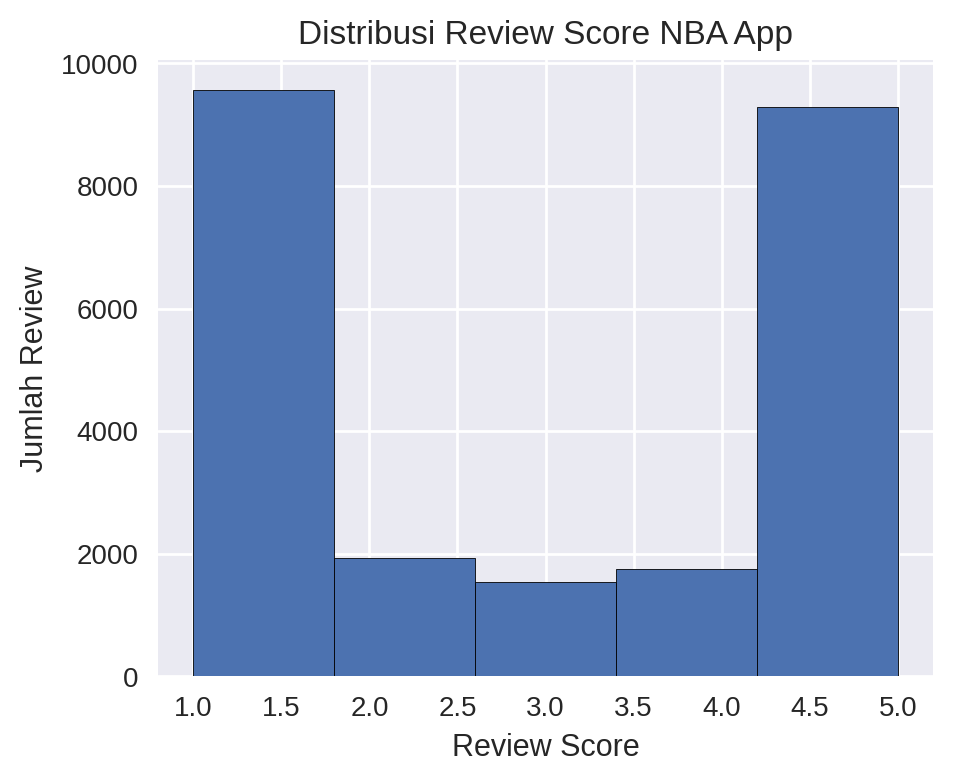

In [ ]:
# Menampilkan review score ke dalam bar chart
#plt.figure(figsize=[5,4])
#plt.hist(df_hdrev['score'])
#plt.show()

# Menampilkan distribusi review score dalam bentuk histogram
plt.figure(figsize=[5, 4])
plt.hist(df_nba['score'], bins=5, edgecolor='black')  # Menambahkan batas agar lebih jelas
plt.xlabel('Review Score')
plt.ylabel('Jumlah Review')
plt.title('Distribusi Review Score NBA App')
plt.show()

##Step 2 - Remove Empty Review

In [ ]:
# Menghapus review yang kosong atau NaN pada kolom 'content'
df_nba = df_nba.dropna(subset=['content'])  # Hapus NaN
df_nba = df_nba[df_nba['content'].str.strip() != '']  # Hapus string kosong setelah di-trim


In [ ]:
# Memeriksa apakah masih ada review kosong
df_nba[df_nba['content'].str.strip() == '']

,id,content,score,thumbsUpCount,reviewCreatedVersion,at


##Step 3 - Hapus review selain bahasa inggris

# ====================================================
# Language Detection
- Detect the language of each review
- Filter only English-language reviews
# ====================================================

In [ ]:
print(df_nba_reviews['content'][0])

This app won't allow you to unsubscribe in your league pass. Always declining.


In [ ]:
!pip install langdetect

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 11.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993222 sha256=643b5f15890e0be12996322a4dfa3af8cc2f1a4d546a7d6bf92b80b5b548cb57
  Stored in directory: /root/.cache/pip/wheels/0a/f2/b2/e5ca405801e05eb7c8ed5b3b4bcf1fcabcd6272c167640072e
Successfully built langdetect


In [ ]:
from langdetect import detect, LangDetectException
import pandas as pd
from collections import Counter

def detect_language(text):
    try:
        return detect(str(text))  # Pastikan teks dalam bentuk string
    except LangDetectException:
        return 'unknown'  # Jika error, kembalikan 'unknown'

# Terapkan fungsi ke kolom 'content'
df_nba['language'] = df_nba['content'].fillna('').apply(detect_language)

In [ ]:
# Hitung jumlah review berdasarkan bahasa
language_counts = Counter(df_nba['language'])
language_df = pd.DataFrame.from_dict(language_counts, orient='index', columns=['count'])
language_df.index.name = 'language'
language_df = language_df.sort_values(by=['count'], ascending=False).reset_index()

# Filter hanya review yang berbahasa Inggris
df_nba = df_nba[df_nba['language'] == 'en']

# Hapus kolom 'language' setelah digunakan
df_nba.drop(columns=['language'], inplace=True)

# Tampilkan distribusi bahasa
language_df


<ipython-input-16-97540d1ebf65>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nba.drop(columns=['language'], inplace=True)


,language,count
0,en,18646
1,so,773
2,af,687
3,ro,415
4,it,287
5,no,267
6,tl,265
7,sl,254
8,fr,234
9,pl,213


In [ ]:
df_nba.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18646 entries, 0 to 24102
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   id                    18646 non-null  int64         
 1   content               18646 non-null  object        
 2   score                 18646 non-null  int64         
 3   thumbsUpCount         18646 non-null  int64         
 4   reviewCreatedVersion  15154 non-null  object        
 5   at                    18646 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int64(3), object(2)
memory usage: 1019.7+ KB


In [ ]:
# print(df_nba['content'][500])  # Opsional, hanya jika ingin mengecek indeks tertentu

try:
    print(df_nba['content'][0])
except (KeyError, IndexError):
    print("content sudah dihapus")

This app won't allow you to unsubscribe in your league pass. Always declining.


#Data Preprocessing

In [ ]:
!pip install emoji
!pip install wordcloud

import numpy as np
import pandas as pd
pd.set_option("display.max_colwidth", 200)
#from pandas_profiling import ProfileReport
import regex
import nltk
import wordcloud
import textblob

from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from wordcloud import WordCloud, STOPWORDS
from textblob import TextBlob

import string
import re
import emoji

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 590.6/590.6 kB 7.8 MB/s eta 0:00:00


# Step 3 - Sentiment Polarity and Subjective Before Preprocessing
# ====================================================
# Calculate Sentiment Polarity and Subjectivity
- Use TextBlob to compute sentiment scores
- Add sentiment polarity, subjectivity, and labels (Positive/Neutral/Negative)
# ====================================================

In [ ]:
#Creating polarity on the column: content (review from the apps) using TextBlob
#Read https://textblob.readthedocs.io/en/dev/quickstart.html

# Handle None values in 'content' column by replacing them with empty strings
df_nba['sentiment_polarity'] = df_nba['content'].astype(str).apply(lambda x: TextBlob(x).polarity)
df_nba['sentiment_subjective'] = df_nba['content'].astype(str).apply(lambda x: TextBlob(x).subjectivity)

In [ ]:
#df_hdrev.loc[:,["content","score","sentiment_polarity", "sentiment_subjective","at"]]
df_nba.loc[:, ["id", "content", "score", "sentiment_polarity", "sentiment_subjective"]]

,id,content,score,sentiment_polarity,sentiment_subjective
0,1,This app won't allow you to unsubscribe in your league pass. Always declining.,1,0.000000,0.000000
1,2,Great app! Great Support team! The new multi view feature is the best way to keep up,5,0.784091,0.563636
2,3,this app is TERRIBLE at streaming anywhere other than on the app itself (this goes for streaming it from my laptop to TV too). I literally can't stream this from my phone to the TV.,1,-0.562500,0.687500
4,5,Don't like NBA nor sports ony here to get 10 points,3,0.000000,0.000000
5,6,Great App,5,0.800000,0.750000
...,...,...,...,...,...
24098,24099,"Video is awesome, but unable to log in as only shows username field.",4,0.166667,0.833333
24099,24100,"Downloaded the app onto my Huawei 7-inch table. But when I went to log in onto my NBA account the page could not show up fully, and I could only see the USERNAME box. Hope this is fixed soon, th...",3,0.033333,0.433333
24100,24101,I've purchased league pass / NBA.TV already and ive been impatiently waiting for the app. I've got high hopes it will meet expectations later but right now it misses the mark. Not optimized for my...,2,0.149143,0.495143
24101,24102,Can't wait for the season to start!,5,0.000000,0.000000


In [ ]:
#Add a column name polarity_rating from changing the score of the review into 3 labels: Pos, Negative Neutral
df_nba.loc[:, 'sentiment_rating'] = df_nba['score'].apply(lambda x: 'Positive' if x > 3 else ('Neutral' if x == 3 else 'Negative'))

# ====================================================
# Visualizations
- Sentiment Scatter Plot
- WordClouds (all, positive, negative)
- Histograms and line plots (score distribution, time series)
# ====================================================

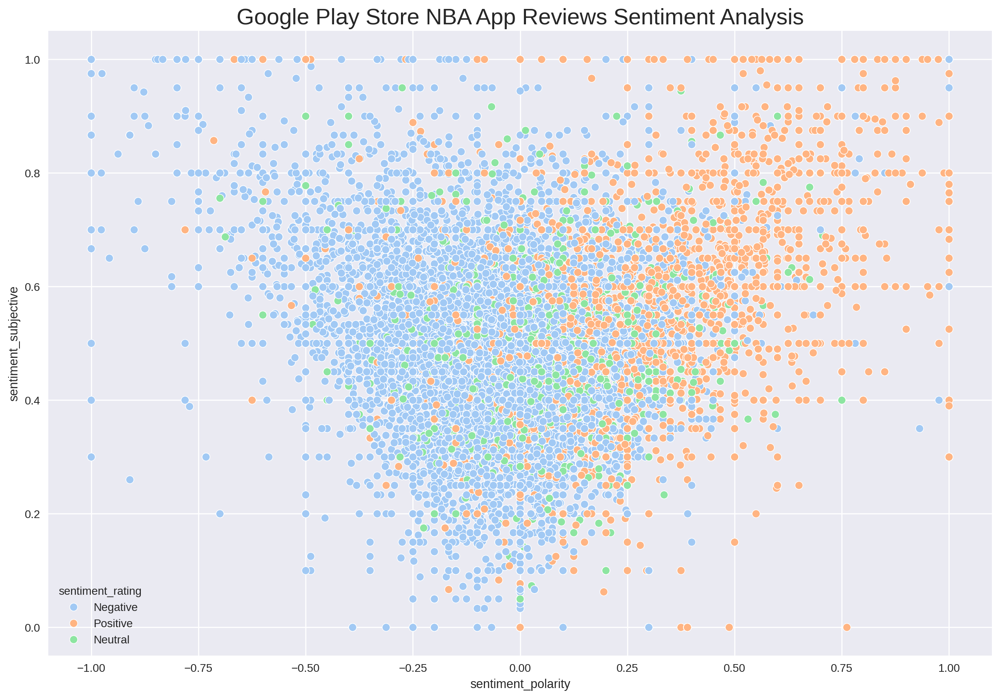

In [ ]:
plt.figure(figsize=(15, 10))

# Scatter plot analisis sentimen NBA reviews
sns.scatterplot(x=df_nba['sentiment_polarity'],
                y=df_nba['sentiment_subjective'],
                hue=df_nba['sentiment_rating'],
                edgecolor='white',
                palette="pastel")

plt.title("Google Play Store NBA App Reviews Sentiment Analysis", fontsize=20)
plt.show()


# Step 4 - Remove Special Characters (Emoji)
# ====================================================
# Remove Emojis and Special Characters
- Clean reviews from emojis and non-standard Unicode symbols
# ====================================================



In [ ]:
# print(df_hdrev_raw['content'][1])
# print(df_hdrev_raw['content'][28])
# print(df_hdrev_raw['content'][234])

In [ ]:
import re

# Fungsi untuk menghapus emoji dari teks
def remove_emojis(text):
    emoji_pattern = re.compile(
        "["
        u"\U0001F600-\U0001F64F"  # Emoticons
        u"\U0001F300-\U0001F5FF"  # Simbol & Piktograf
        u"\U0001F680-\U0001F6FF"  # Simbol Transportasi & Peta
        u"\U0001F1E0-\U0001F1FF"  # Bendera (iOS)
        u"\U00002500-\U00002BEF"  # Karakter Cina
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u"\U00010000-\U0010ffff"  # Simbol Unicode tambahan
        u"\u2640-\u2642"  # Simbol Gender
        u"\u2600-\u2B55"  # Simbol Lainnya
        u"\u200d"  # Zero Width Joiner
        u"\u23cf"
        u"\u23e9"
        u"\u231a"
        u"\ufe0f"  # Dingbats
        u"\u3030"
        "]+", flags=re.UNICODE
    )
    return emoji_pattern.sub(r'', text) if isinstance(text, str) else text  # Hanya proses jika teks

# Terapkan fungsi remove_emojis ke kolom 'content'
df_nba.loc[:, 'content'] = df_nba['content'].astype(str).apply(remove_emojis)

In [ ]:
print(df_nba['content'][1])
print(df_nba['content'][28])
print(df_nba['content'][234])


Great app! Great Support team! The new multi view feature is the best way to keep up


KeyError: 28

# Step 5 - Lower Case the Content
# ====================================================
# Normalize Text
- Lowercase all content
- Expand contractions (e.g. “don’t” → “do not”)
- Tokenize text into words
# ====================================================

In [ ]:
print(df_nba_reviews['content'][5])
print(df_nba_reviews['content'][50])

Great App
Great app for NBA moments at your finger tips, but app hangs while playing the NBA Quiz and Games. The Trivia is still not fixed, pretty useless.


In [ ]:
# Mengubah tipe data kolom content menjadi string
df_nba.loc[:, 'content'] = df_nba['content'].astype(str)

In [ ]:
# # Mengubah semua teks di kolom 'content' menjadi huruf kecil
df_nba.loc[:, 'content'] = df_nba['content'].apply(lambda x: x.lower())
# print(df_hdrev['content'][5])
# print(df_hdrev['content'][55])

## Step 1 - Tokenizing

In [ ]:
import nltk
import os
import shutil

# Hapus cache NLTK
nltk_data_path = os.path.expanduser('~/nltk_data')
if os.path.exists(nltk_data_path):
    shutil.rmtree(nltk_data_path)  # Hapus semua data NLTK

# Download ulang 'punkt'
nltk.download('punkt')

# Paksa NLTK mencari ulang lokasi tokenizers
nltk.data.find('tokenizers/punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


FileSystemPathPointer('/root/nltk_data/tokenizers/punkt')

In [ ]:
import nltk
# Download the missing 'punkt_tab' data package
nltk.download('punkt_tab')

from nltk.tokenize import word_tokenize

# Pastikan df_nba adalah salinan independen
df_nba = df_nba.copy()

# Tokenisasi kolom 'content'
df_nba['token'] = df_nba['content'].apply(lambda x: word_tokenize(str(x)))

# Tampilkan dataframe dengan token
display(df_nba[['content', 'token']])

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


,content,token
0,this app won't allow you to unsubscribe in your league pass. always declining.,"[this, app, wo, n't, allow, you, to, unsubscribe, in, your, league, pass, ., always, declining, .]"
1,great app! great support team! the new multi view feature is the best way to keep up,"[great, app, !, great, support, team, !, the, new, multi, view, feature, is, the, best, way, to, keep, up]"
2,this app is terrible at streaming anywhere other than on the app itself (this goes for streaming it from my laptop to tv too). i literally can't stream this from my phone to the tv.,"[this, app, is, terrible, at, streaming, anywhere, other, than, on, the, app, itself, (, this, goes, for, streaming, it, from, my, laptop, to, tv, too, ), ., i, literally, ca, n't, stream, this, f..."
4,don't like nba nor sports ony here to get 10 points,"[do, n't, like, nba, nor, sports, ony, here, to, get, 10, points]"
5,great app,"[great, app]"
...,...,...
24098,"video is awesome, but unable to log in as only shows username field.","[video, is, awesome, ,, but, unable, to, log, in, as, only, shows, username, field, .]"
24099,"downloaded the app onto my huawei 7-inch table. but when i went to log in onto my nba account the page could not show up fully, and i could only see the username box. hope this is fixed soon, th...","[downloaded, the, app, onto, my, huawei, 7-inch, table, ., but, when, i, went, to, log, in, onto, my, nba, account, the, page, could, not, show, up, fully, ,, and, i, could, only, see, the, userna..."
24100,i've purchased league pass / nba.tv already and ive been impatiently waiting for the app. i've got high hopes it will meet expectations later but right now it misses the mark. not optimized for my...,"[i, 've, purchased, league, pass, /, nba.tv, already, and, ive, been, impatiently, waiting, for, the, app, ., i, 've, got, high, hopes, it, will, meet, expectations, later, but, right, now, it, mi..."
24101,can't wait for the season to start!,"[ca, n't, wait, for, the, season, to, start, !]"


##Expand Contractions

In [ ]:
!pip install spacy
!pip install contractions
import spacy
import contractions

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.9/289.9 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.3/118.3 kB 7.2 MB/s eta 0:00:00


In [ ]:
import nltk
from nltk.tokenize import word_tokenize
import contractions

def expand_contractions(text):
    # Pastikan teks bukan None atau NaN sebelum diproses
    if isinstance(text, str) and len(text) > 0:
        try:
            return contractions.fix(text)  # Ekspansi kontraksi
        except IndexError:
            return text  # Jika terjadi error, kembalikan teks asli
    return text

# Terapkan ekspansi kontraksi ke kolom 'content'
df_nba['expanded_content'] = df_nba['content'].apply(expand_contractions)

# Tokenisasi setelah kontraksi diperluas
df_nba['token'] = df_nba['expanded_content'].apply(word_tokenize)

# Tampilkan hasil
display(df_nba[['content', 'expanded_content', 'token']])

,content,expanded_content,token
0,this app won't allow you to unsubscribe in your league pass. always declining.,this app will not allow you to unsubscribe in your league pass. always declining.,"[this, app, will, not, allow, you, to, unsubscribe, in, your, league, pass, ., always, declining, .]"
1,great app! great support team! the new multi view feature is the best way to keep up,great app! great support team! the new multi view feature is the best way to keep up,"[great, app, !, great, support, team, !, the, new, multi, view, feature, is, the, best, way, to, keep, up]"
2,this app is terrible at streaming anywhere other than on the app itself (this goes for streaming it from my laptop to tv too). i literally can't stream this from my phone to the tv.,this app is terrible at streaming anywhere other than on the app itself (this goes for streaming it from my laptop to tv too). i literally cannot stream this from my phone to the tv.,"[this, app, is, terrible, at, streaming, anywhere, other, than, on, the, app, itself, (, this, goes, for, streaming, it, from, my, laptop, to, tv, too, ), ., i, literally, can, not, stream, this, ..."
4,don't like nba nor sports ony here to get 10 points,do not like nba nor sports ony here to get 10 points,"[do, not, like, nba, nor, sports, ony, here, to, get, 10, points]"
5,great app,great app,"[great, app]"
...,...,...,...
24098,"video is awesome, but unable to log in as only shows username field.","video is awesome, but unable to log in as only shows username field.","[video, is, awesome, ,, but, unable, to, log, in, as, only, shows, username, field, .]"
24099,"downloaded the app onto my huawei 7-inch table. but when i went to log in onto my nba account the page could not show up fully, and i could only see the username box. hope this is fixed soon, th...","downloaded the app onto my huawei 7-inch table. but when i went to log in onto my nba account the page could not show up fully, and i could only see the username box. hope this is fixed soon, th...","[downloaded, the, app, onto, my, huawei, 7-inch, table, ., but, when, i, went, to, log, in, onto, my, nba, account, the, page, could, not, show, up, fully, ,, and, i, could, only, see, the, userna..."
24100,i've purchased league pass / nba.tv already and ive been impatiently waiting for the app. i've got high hopes it will meet expectations later but right now it misses the mark. not optimized for my...,i have purchased league pass / nba.tv already and i have been impatiently waiting for the app. i have got high hopes it will meet expectations later but right now it misses the mark. not optimized...,"[i, have, purchased, league, pass, /, nba.tv, already, and, i, have, been, impatiently, waiting, for, the, app, ., i, have, got, high, hopes, it, will, meet, expectations, later, but, right, now, ..."
24101,can't wait for the season to start!,cannot wait for the season to start!,"[can, not, wait, for, the, season, to, start, !]"


##Punctuations Removal

# ====================================================
# STEP 7: Clean Tokens
- Remove punctuation, digits, and stopwords
- Keep alphabetic tokens only
# ====================================================

In [ ]:
import re
import string
def cleaning_text(text):
    # Menambah spasi setelah koma jika tidak ada spasi
    text = re.sub(r",(?!\s)", ", ", text)
    # Menghapus tab, newline, backslash
    text = text.replace('\\t', " ").replace('\\n', " ").replace('\\u', " ").replace('\\', "")
    # Menghapus karakter non-ASCII (emoticon, huruf Cina, dll.)
    text = text.encode('ascii', 'replace').decode('ascii')
    # Menghapus URL
    text = re.sub(r"(?i)(?:https?:\/\/)?(?:www\.)?(?:[a-zA-Z0-9-.]+)(?:\.[a-zA-Z]{2,6})(?:\/[^\s\r\n]*)?", "", text)
    # Menghapus angka
    text = re.sub(r"\d+", "", text)
    # Menghapus tanda baca
    text = text.translate(str.maketrans("", "", string.punctuation))
    # Menghapus whitespace berlebih dan karakter tunggal
    text = text.strip()
    text = re.sub('\s+', ' ', text)
    return re.sub(r"\b[a-zA-Z]\b", "", text)

# Terapkan fungsi pembersihan ke kolom content
df_nba['cleaned_content'] = df_nba['content'].astype(str).apply(cleaning_text)

# Tokenisasi setelah teks dibersihkan
df_nba['token'] = df_nba['cleaned_content'].apply(word_tokenize)

In [ ]:
df_nba.loc[:, ["content", "cleaned_content", "token"]]

,content,cleaned_content,token
0,this app won't allow you to unsubscribe in your league pass. always declining.,this app wont allow you to unsubscribe in your league pass always declining,"[this, app, wont, allow, you, to, unsubscribe, in, your, league, pass, always, declining]"
1,great app! great support team! the new multi view feature is the best way to keep up,great app great support team the new multi view feature is the best way to keep up,"[great, app, great, support, team, the, new, multi, view, feature, is, the, best, way, to, keep, up]"
2,this app is terrible at streaming anywhere other than on the app itself (this goes for streaming it from my laptop to tv too). i literally can't stream this from my phone to the tv.,this app is terrible at streaming anywhere other than on the app itself this goes for streaming it from my laptop to tv too literally cant stream this from my phone to the tv,"[this, app, is, terrible, at, streaming, anywhere, other, than, on, the, app, itself, this, goes, for, streaming, it, from, my, laptop, to, tv, too, literally, cant, stream, this, from, my, phone,..."
4,don't like nba nor sports ony here to get 10 points,dont like nba nor sports ony here to get points,"[dont, like, nba, nor, sports, ony, here, to, get, points]"
5,great app,great app,"[great, app]"
...,...,...,...
24098,"video is awesome, but unable to log in as only shows username field.",video is awesome but unable to log in as only shows username field,"[video, is, awesome, but, unable, to, log, in, as, only, shows, username, field]"
24099,"downloaded the app onto my huawei 7-inch table. but when i went to log in onto my nba account the page could not show up fully, and i could only see the username box. hope this is fixed soon, th...",downloaded the app onto my huawei inch table but when went to log in onto my nba account the page could not show up fully and could only see the username box hope this is fixed soon the season i...,"[downloaded, the, app, onto, my, huawei, inch, table, but, when, went, to, log, in, onto, my, nba, account, the, page, could, not, show, up, fully, and, could, only, see, the, username, box, hope,..."
24100,i've purchased league pass / nba.tv already and ive been impatiently waiting for the app. i've got high hopes it will meet expectations later but right now it misses the mark. not optimized for my...,ive purchased league pass already and ive been impatiently waiting for the app ive got high hopes it will meet expectations later but right now it misses the mark not optimized for my xoomtablets ...,"[ive, purchased, league, pass, already, and, ive, been, impatiently, waiting, for, the, app, ive, got, high, hopes, it, will, meet, expectations, later, but, right, now, it, misses, the, mark, not..."
24101,can't wait for the season to start!,cant wait for the season to start,"[cant, wait, for, the, season, to, start]"


##Before Stopwords removal

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
def freq_words(x, terms=30):
    all_words = ' '.join(text for text in x)
    all_words = all_words.split()

    word_counts = Counter(all_words)  # Hitung frekuensi kata
    words_df = pd.DataFrame({'word': list(word_counts.keys()), 'count': list(word_counts.values())})

    # Pilih kata dengan frekuensi tertinggi
    d = words_df.nlargest(columns="count", n=terms)

    plt.figure(figsize=(20, 5))
    ax = sns.barplot(data=d, x="word", y="count", palette=sns.color_palette("rainbow", n_colors=terms))
    ax.set(ylabel='Count')
    plt.xticks(rotation=45)  # Memiringkan label agar lebih mudah dibaca
    plt.show()

<ipython-input-37-5b746640a338>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=d, x="word", y="count", palette=sns.color_palette("rainbow", n_colors=terms))


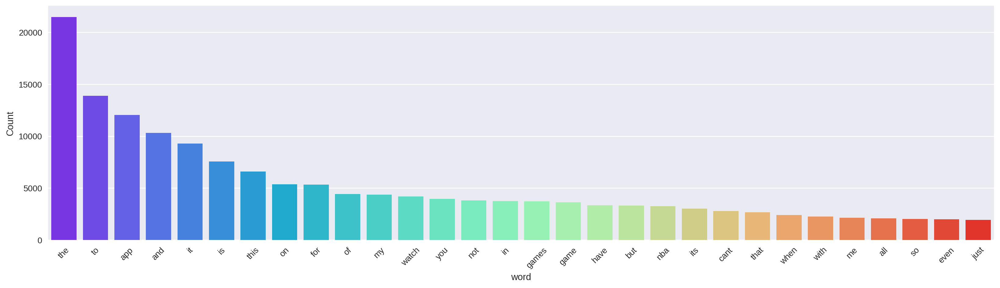

In [ ]:
# Frekuensi kata setelah pembersihan stopwords
freq_words(df_nba['cleaned_content'])

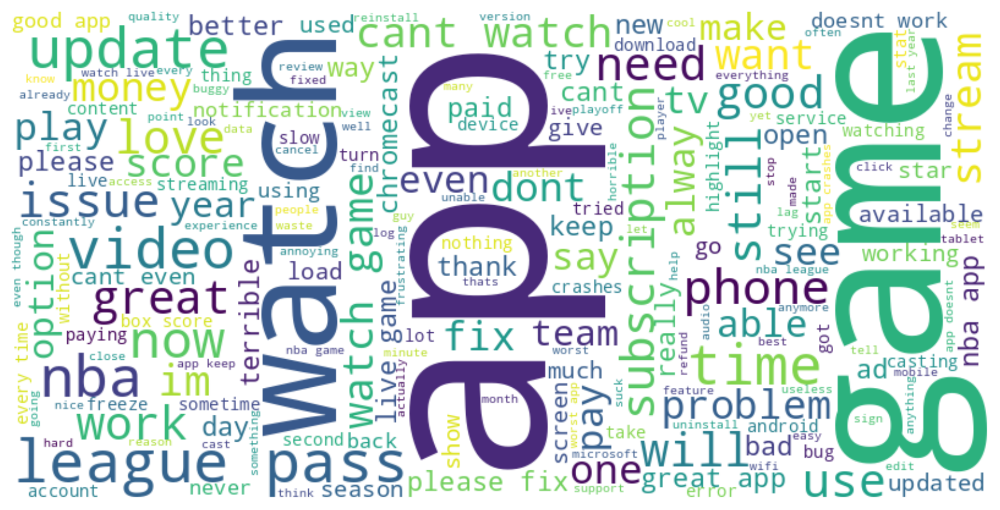

In [ ]:
# Gabungkan semua teks dalam kolom 'cleaned_content' menjadi satu string
all_words_after = ' '.join(df_nba['cleaned_content'])

# Buat WordCloud
wordcloud_after = WordCloud(width=800, height=400, background_color='white').generate(all_words_after)

# Tampilkan WordCloud
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud_after, interpolation='bilinear')
plt.axis('off')
plt.show()


##Stopword Removal

In [ ]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

# Ambil daftar stopwords bahasa Inggris
english_stopwords = set(stopwords.words('english'))  # Gunakan set untuk akses lebih cepat

# Tambahkan kata tambahan ke dalam stopwords
english_stopwords.update(['app', 'used'])  # update() lebih efisien dibanding extend()

# Terapkan stopword removal ke setiap list token
df_nba["token_after_sr"] = df_nba["token"].apply(lambda tokens: [word for word in tokens if isinstance(tokens, list) and word not in english_stopwords and word.isalpha()])

# Gabungkan token menjadi teks yang bersih dalam kolom cleaned_content
df_nba["cleaned_content"] = df_nba["token_after_sr"].apply(lambda tokens: ' '.join(tokens))

# Tampilkan hasil
display(df_nba[['content', 'cleaned_content', 'token', 'token_after_sr']])

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


,content,cleaned_content,token,token_after_sr
0,this app won't allow you to unsubscribe in your league pass. always declining.,wont allow unsubscribe league pass always declining,"[this, app, wont, allow, you, to, unsubscribe, in, your, league, pass, always, declining]","[wont, allow, unsubscribe, league, pass, always, declining]"
1,great app! great support team! the new multi view feature is the best way to keep up,great great support team new multi view feature best way keep,"[great, app, great, support, team, the, new, multi, view, feature, is, the, best, way, to, keep, up]","[great, great, support, team, new, multi, view, feature, best, way, keep]"
2,this app is terrible at streaming anywhere other than on the app itself (this goes for streaming it from my laptop to tv too). i literally can't stream this from my phone to the tv.,terrible streaming anywhere goes streaming laptop tv literally cant stream phone tv,"[this, app, is, terrible, at, streaming, anywhere, other, than, on, the, app, itself, this, goes, for, streaming, it, from, my, laptop, to, tv, too, literally, cant, stream, this, from, my, phone,...","[terrible, streaming, anywhere, goes, streaming, laptop, tv, literally, cant, stream, phone, tv]"
4,don't like nba nor sports ony here to get 10 points,dont like nba sports ony get points,"[dont, like, nba, nor, sports, ony, here, to, get, points]","[dont, like, nba, sports, ony, get, points]"
5,great app,great,"[great, app]",[great]
...,...,...,...,...
24098,"video is awesome, but unable to log in as only shows username field.",video awesome unable log shows username field,"[video, is, awesome, but, unable, to, log, in, as, only, shows, username, field]","[video, awesome, unable, log, shows, username, field]"
24099,"downloaded the app onto my huawei 7-inch table. but when i went to log in onto my nba account the page could not show up fully, and i could only see the username box. hope this is fixed soon, th...",downloaded onto huawei inch table went log onto nba account page could show fully could see username box hope fixed soon season starting couple days,"[downloaded, the, app, onto, my, huawei, inch, table, but, when, went, to, log, in, onto, my, nba, account, the, page, could, not, show, up, fully, and, could, only, see, the, username, box, hope,...","[downloaded, onto, huawei, inch, table, went, log, onto, nba, account, page, could, show, fully, could, see, username, box, hope, fixed, soon, season, starting, couple, days]"
24100,i've purchased league pass / nba.tv already and ive been impatiently waiting for the app. i've got high hopes it will meet expectations later but right now it misses the mark. not optimized for my...,ive purchased league pass already ive impatiently waiting ive got high hopes meet expectations later right misses mark optimized xoomtablets cant even see boxes login account nba put better stuff,"[ive, purchased, league, pass, already, and, ive, been, impatiently, waiting, for, the, app, ive, got, high, hopes, it, will, meet, expectations, later, but, right, now, it, misses, the, mark, not...","[ive, purchased, league, pass, already, ive, impatiently, waiting, ive, got, high, hopes, meet, expectations, later, right, misses, mark, optimized, xoomtablets, cant, even, see, boxes, login, acc..."
24101,can't wait for the season to start!,cant wait season start,"[cant, wait, for, the, season, to, start]","[cant, wait, season, start]"


In [ ]:
df_nba.head()

,id,content,score,thumbsUpCount,reviewCreatedVersion,at,sentiment_polarity,sentiment_subjective,sentiment_rating,token,expanded_content,cleaned_content,token_after_sr
0,1,this app won't allow you to unsubscribe in your league pass. always declining.,1,0,12.0607,2025-03-19 04:00:45,0.000000,0.000000,Negative,"[this, app, wont, allow, you, to, unsubscribe, in, your, league, pass, always, declining]",this app will not allow you to unsubscribe in your league pass. always declining.,wont allow unsubscribe league pass always declining,"[wont, allow, unsubscribe, league, pass, always, declining]"
1,2,great app! great support team! the new multi view feature is the best way to keep up,5,0,0.60.0,2025-03-19 03:04:52,0.784091,0.563636,Positive,"[great, app, great, support, team, the, new, multi, view, feature, is, the, best, way, to, keep, up]",great app! great support team! the new multi view feature is the best way to keep up,great great support team new multi view feature best way keep,"[great, great, support, team, new, multi, view, feature, best, way, keep]"
2,3,this app is terrible at streaming anywhere other than on the app itself (this goes for streaming it from my laptop to tv too). i literally can't stream this from my phone to the tv.,1,0,None,2025-03-19 02:28:50,-0.562500,0.687500,Negative,"[this, app, is, terrible, at, streaming, anywhere, other, than, on, the, app, itself, this, goes, for, streaming, it, from, my, laptop, to, tv, too, literally, cant, stream, this, from, my, phone,...",this app is terrible at streaming anywhere other than on the app itself (this goes for streaming it from my laptop to tv too). i literally cannot stream this from my phone to the tv.,terrible streaming anywhere goes streaming laptop tv literally cant stream phone tv,"[terrible, streaming, anywhere, goes, streaming, laptop, tv, literally, cant, stream, phone, tv]"
4,5,don't like nba nor sports ony here to get 10 points,3,0,None,2025-03-18 17:36:13,0.000000,0.000000,Neutral,"[dont, like, nba, nor, sports, ony, here, to, get, points]",do not like nba nor sports ony here to get 10 points,dont like nba sports ony get points,"[dont, like, nba, sports, ony, get, points]"
5,6,great app,5,0,0.60.0,2025-03-18 13:55:53,0.800000,0.750000,Positive,"[great, app]",great app,great,[great]


<ipython-input-37-5b746640a338>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=d, x="word", y="count", palette=sns.color_palette("rainbow", n_colors=terms))


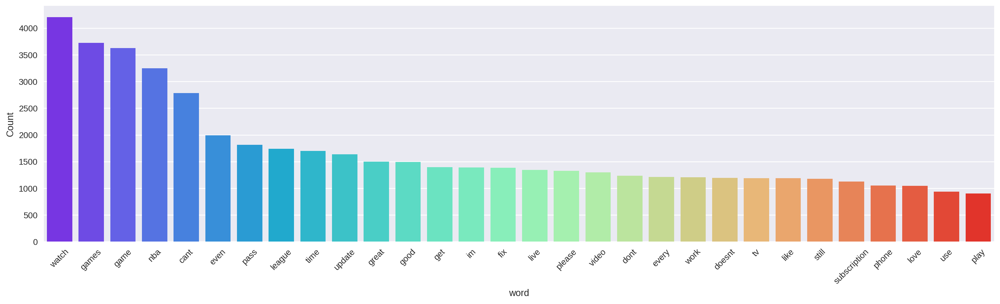

In [ ]:
# Frekuensi kata setelah pembersihan stopwords
freq_words(df_nba['cleaned_content'])

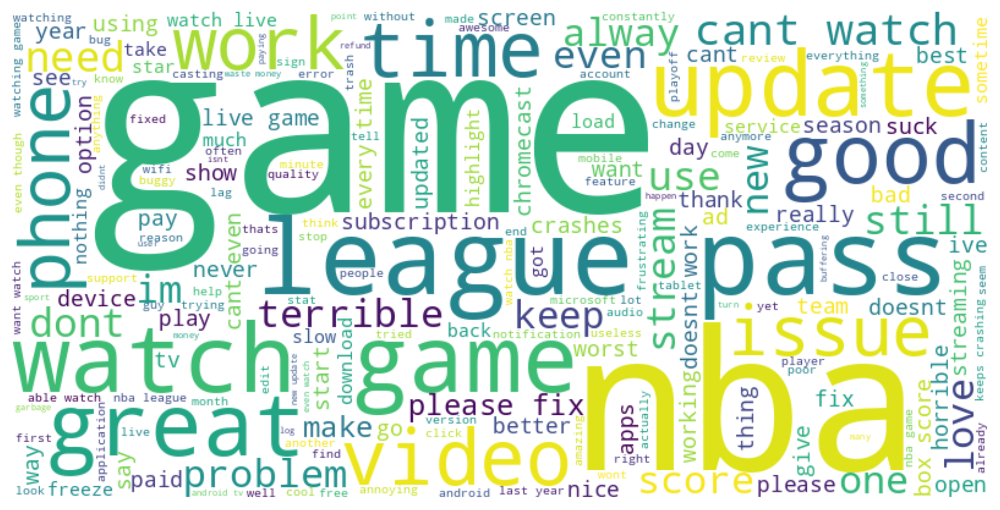

In [ ]:
# Gabungkan semua teks dalam kolom 'cleaned_content' menjadi satu string
all_words_after = ' '.join(df_nba['cleaned_content'])

# Buat WordCloud
wordcloud_after = WordCloud(width=800, height=400, background_color='white').generate(all_words_after)

# Tampilkan WordCloud
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud_after, interpolation='bilinear')
plt.axis('off')
plt.show()


#Stemming & Lemmatization

- Apply lemmatization with POS tagging for grammatical accuracy


In [ ]:
import nltk

# Download the necessary NLTK data packages
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
nltk.download('universal_tagset')
nltk.download('averaged_perceptron_tagger_eng')  # Download the missing resource

from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from nltk import pos_tag

lemmatizer = WordNetLemmatizer()

# Function to get the Part of Speech (POS) for more accurate lemmatization
def get_wordnet_pos(word):
    tag = pos_tag([word])[0][1][0].upper()  # Get the first letter of the POS tag
    tag_dict = {"J": wordnet.ADJ, "N": wordnet.NOUN, "V": wordnet.VERB, "R": wordnet.ADV}
    return tag_dict.get(tag, wordnet.NOUN)  # Default to NOUN if not found

# Function for lemmatization with POS tagging
def lemmatize_tokens(tokens):
    return [lemmatizer.lemmatize(word, get_wordnet_pos(word)) for word in tokens]

# Apply lemmatization to token_after_sr
df_nba["token_after_lemma"] = df_nba["token_after_sr"].apply(lemmatize_tokens)

# Gabungkan kembali token menjadi teks bersih setelah lemmatization
df_nba["cleaned_content"] = df_nba["token_after_lemma"].apply(lambda tokens: ' '.join(tokens))

# Tampilkan DataFrame dengan semua kolom, tetapi tanpa stemming

# Tampilkan dataframe dengan format awal yang sama
display(df_nba)

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package universal_tagset to /root/nltk_data...
[nltk_data]   Package universal_tagset is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!


,id,content,score,thumbsUpCount,reviewCreatedVersion,at,sentiment_polarity,sentiment_subjective,sentiment_rating,token,expanded_content,cleaned_content,token_after_sr,token_after_lemma
0,1,this app won't allow you to unsubscribe in your league pass. always declining.,1,0,12.0607,2025-03-19 04:00:45,0.000000,0.000000,Negative,"[this, app, wont, allow, you, to, unsubscribe, in, your, league, pass, always, declining]",this app will not allow you to unsubscribe in your league pass. always declining.,wont allow unsubscribe league pas always decline,"[wont, allow, unsubscribe, league, pass, always, declining]","[wont, allow, unsubscribe, league, pas, always, decline]"
1,2,great app! great support team! the new multi view feature is the best way to keep up,5,0,0.60.0,2025-03-19 03:04:52,0.784091,0.563636,Positive,"[great, app, great, support, team, the, new, multi, view, feature, is, the, best, way, to, keep, up]",great app! great support team! the new multi view feature is the best way to keep up,great great support team new multi view feature best way keep,"[great, great, support, team, new, multi, view, feature, best, way, keep]","[great, great, support, team, new, multi, view, feature, best, way, keep]"
2,3,this app is terrible at streaming anywhere other than on the app itself (this goes for streaming it from my laptop to tv too). i literally can't stream this from my phone to the tv.,1,0,None,2025-03-19 02:28:50,-0.562500,0.687500,Negative,"[this, app, is, terrible, at, streaming, anywhere, other, than, on, the, app, itself, this, goes, for, streaming, it, from, my, laptop, to, tv, too, literally, cant, stream, this, from, my, phone,...",this app is terrible at streaming anywhere other than on the app itself (this goes for streaming it from my laptop to tv too). i literally cannot stream this from my phone to the tv.,terrible stream anywhere go stream laptop tv literally cant stream phone tv,"[terrible, streaming, anywhere, goes, streaming, laptop, tv, literally, cant, stream, phone, tv]","[terrible, stream, anywhere, go, stream, laptop, tv, literally, cant, stream, phone, tv]"
4,5,don't like nba nor sports ony here to get 10 points,3,0,None,2025-03-18 17:36:13,0.000000,0.000000,Neutral,"[dont, like, nba, nor, sports, ony, here, to, get, points]",do not like nba nor sports ony here to get 10 points,dont like nba sport ony get point,"[dont, like, nba, sports, ony, get, points]","[dont, like, nba, sport, ony, get, point]"
5,6,great app,5,0,0.60.0,2025-03-18 13:55:53,0.800000,0.750000,Positive,"[great, app]",great app,great,[great],[great]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24098,24099,"video is awesome, but unable to log in as only shows username field.",4,2,3.1223,2011-12-24 21:06:38,0.166667,0.833333,Positive,"[video, is, awesome, but, unable, to, log, in, as, only, shows, username, field]","video is awesome, but unable to log in as only shows username field.",video awesome unable log show username field,"[video, awesome, unable, log, shows, username, field]","[video, awesome, unable, log, show, username, field]"
24099,24100,"downloaded the app onto my huawei 7-inch table. but when i went to log in onto my nba account the page could not show up fully, and i could only see the username box. hope this is fixed soon, th...",3,3,3.1223,2011-12-24 15:54:24,0.033333,0.433333,Neutral,"[downloaded, the, app, onto, my, huawei, inch, table, but, when, went, to, log, in, onto, my, nba, account, the, page, could, not, show, up, fully, and, could, only, see, the, username, box, hope,...","downloaded the app onto my huawei 7-inch table. but when i went to log in onto my nba account the page could not show up fully, and i could only see the username box. hope this is fixed soon, th...",download onto huawei inch table go log onto nba account page could show fully could see username box hope fix soon season start couple day,"[downloaded, onto, huawei, inch, table, went, log, onto, nba, account, page, could, show, fully,

##Rare Words Removal

In [ ]:
from nltk.probability import FreqDist

# Hitung frekuensi kata berdasarkan seluruh dataset
all_tokens = [word for tokens in df_nba["token_after_lemma"] for word in tokens]  # Gabungkan semua token
fdist = FreqDist(all_tokens)  # Hitung frekuensi global

# Tentukan kata yang jarang muncul berdasarkan threshold
threshold = 2
rare_words = set(word for word, freq in fdist.items() if freq <= threshold)

# Fungsi untuk menghapus kata langka berdasarkan frekuensi global
def rare_words_removal(tokens):
    return [word for word in tokens if word not in rare_words]

# Terapkan fungsi ini ke setiap baris di kolom 'token_after_lemma'
df_nba['token_after_rwr'] = df_nba['token_after_lemma'].apply(rare_words_removal)

# Tampilkan DataFrame untuk verifikasi
display(df_nba)

,id,content,score,thumbsUpCount,reviewCreatedVersion,at,sentiment_polarity,sentiment_subjective,sentiment_rating,token,expanded_content,cleaned_content,token_after_sr,token_after_lemma,token_after_rwr
0,1,this app won't allow you to unsubscribe in your league pass. always declining.,1,0,12.0607,2025-03-19 04:00:45,0.000000,0.000000,Negative,"[this, app, wont, allow, you, to, unsubscribe, in, your, league, pass, always, declining]",this app will not allow you to unsubscribe in your league pass. always declining.,wont allow unsubscribe league pas always decline,"[wont, allow, unsubscribe, league, pass, always, declining]","[wont, allow, unsubscribe, league, pas, always, decline]","[wont, allow, unsubscribe, league, pas, always, decline]"
1,2,great app! great support team! the new multi view feature is the best way to keep up,5,0,0.60.0,2025-03-19 03:04:52,0.784091,0.563636,Positive,"[great, app, great, support, team, the, new, multi, view, feature, is, the, best, way, to, keep, up]",great app! great support team! the new multi view feature is the best way to keep up,great great support team new multi view feature best way keep,"[great, great, support, team, new, multi, view, feature, best, way, keep]","[great, great, support, team, new, multi, view, feature, best, way, keep]","[great, great, support, team, new, multi, view, feature, best, way, keep]"
2,3,this app is terrible at streaming anywhere other than on the app itself (this goes for streaming it from my laptop to tv too). i literally can't stream this from my phone to the tv.,1,0,None,2025-03-19 02:28:50,-0.562500,0.687500,Negative,"[this, app, is, terrible, at, streaming, anywhere, other, than, on, the, app, itself, this, goes, for, streaming, it, from, my, laptop, to, tv, too, literally, cant, stream, this, from, my, phone,...",this app is terrible at streaming anywhere other than on the app itself (this goes for streaming it from my laptop to tv too). i literally cannot stream this from my phone to the tv.,terrible stream anywhere go stream laptop tv literally cant stream phone tv,"[terrible, streaming, anywhere, goes, streaming, laptop, tv, literally, cant, stream, phone, tv]","[terrible, stream, anywhere, go, stream, laptop, tv, literally, cant, stream, phone, tv]","[terrible, stream, anywhere, go, stream, laptop, tv, literally, cant, stream, phone, tv]"
4,5,don't like nba nor sports ony here to get 10 points,3,0,None,2025-03-18 17:36:13,0.000000,0.000000,Neutral,"[dont, like, nba, nor, sports, ony, here, to, get, points]",do not like nba nor sports ony here to get 10 points,dont like nba sport ony get point,"[dont, like, nba, sports, ony, get, points]","[dont, like, nba, sport, ony, get, point]","[dont, like, nba, sport, get, point]"
5,6,great app,5,0,0.60.0,2025-03-18 13:55:53,0.800000,0.750000,Positive,"[great, app]",great app,great,[great],[great],[great]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24098,24099,"video is awesome, but unable to log in as only shows username field.",4,2,3.1223,2011-12-24 21:06:38,0.166667,0.833333,Positive,"[video, is, awesome, but, unable, to, log, in, as, only, shows, username, field]","video is awesome, but unable to log in as only shows username field.",video awesome unable log show username field,"[video, awesome, unable, log, shows, username, field]","[video, awesome, unable, log, show, username, field]","[video, awesome, unable, log, show, username, field]"
24099,24100,"downloaded the app onto my huawei 7-inch table. but when i went to log in onto my nba account the page could not show up fully, and i could only see the username box. hope this is fixed soon, th...",3,3,3.1223,2011-12-24 15:54:24,0.033333,0.433333,Neutral,"[downloaded, the, app, onto, my, huawei, inch, table, but, when, went, to, log, in, onto, my, nba, account, the, page, could, not, show, up, fully, and, could, only, see, the, username, box, hope,...","downloaded the app onto my huawei 7-inch table. but when i went to log in onto my nba a

##Common Words Removal
# ====================================================
# Rare and Common Word Filtering
- Remove rare words (appear <= 2 times)
- Remove overly common words (appear too frequently)
# ====================================================

In [ ]:
from nltk.probability import FreqDist

# Hitung threshold secara fleksibel
threshold = max(10, int(len(df_nba) * 0.05))

# Hitung frekuensi kata SEKALI SAJA untuk semua data
all_tokens = [word for sublist in df_nba["token_after_rwr"] for word in sublist]
fdist = FreqDist(all_tokens)

# Tentukan kata-kata umum yang akan dihapus
common_words = set(word for word, freq in fdist.items() if freq >= threshold)

def common_words_removal(tokens):
    filtered_tokens = [word for word in tokens if word not in common_words]
    return filtered_tokens if filtered_tokens else ["EMPTY"]  # Hindari baris kosong

# Terapkan common words removal ke seluruh kolom (lebih cepat)
df_nba['token_after_cwr'] = df_nba['token_after_rwr'].apply(common_words_removal)

# Print kata-kata umum yang dihapus (untuk verifikasi)
print("Common words removed:", list(common_words)[:20])  # Tampilkan 20 kata pertama

# Tampilkan 5 baris pertama DataFrame
df_nba.head()

Common words removed: ['well', 'dont', 'year', 'great', 'go', 'video', 'pas', 'open', 'use', 'play', 'pay', 'still', 'watch', 'league', 'want', 'live', 'get', 'love', 'score', 'like']


,id,content,score,thumbsUpCount,reviewCreatedVersion,at,sentiment_polarity,sentiment_subjective,sentiment_rating,token,expanded_content,cleaned_content,token_after_sr,token_after_lemma,token_after_rwr,token_after_cwr
0,1,this app won't allow you to unsubscribe in your league pass. always declining.,1,0,12.0607,2025-03-19 04:00:45,0.000000,0.000000,Negative,"[this, app, wont, allow, you, to, unsubscribe, in, your, league, pass, always, declining]",this app will not allow you to unsubscribe in your league pass. always declining.,wont allow unsubscribe league pas always decline,"[wont, allow, unsubscribe, league, pass, always, declining]","[wont, allow, unsubscribe, league, pas, always, decline]","[wont, allow, unsubscribe, league, pas, always, decline]","[wont, allow, unsubscribe, always, decline]"
1,2,great app! great support team! the new multi view feature is the best way to keep up,5,0,0.60.0,2025-03-19 03:04:52,0.784091,0.563636,Positive,"[great, app, great, support, team, the, new, multi, view, feature, is, the, best, way, to, keep, up]",great app! great support team! the new multi view feature is the best way to keep up,great great support team new multi view feature best way keep,"[great, great, support, team, new, multi, view, feature, best, way, keep]","[great, great, support, team, new, multi, view, feature, best, way, keep]","[great, great, support, team, new, multi, view, feature, best, way, keep]","[support, team, new, multi, view, feature, best, way]"
2,3,this app is terrible at streaming anywhere other than on the app itself (this goes for streaming it from my laptop to tv too). i literally can't stream this from my phone to the tv.,1,0,None,2025-03-19 02:28:50,-0.562500,0.687500,Negative,"[this, app, is, terrible, at, streaming, anywhere, other, than, on, the, app, itself, this, goes, for, streaming, it, from, my, laptop, to, tv, too, literally, cant, stream, this, from, my, phone,...",this app is terrible at streaming anywhere other than on the app itself (this goes for streaming it from my laptop to tv too). i literally cannot stream this from my phone to the tv.,terrible stream anywhere go stream laptop tv literally cant stream phone tv,"[terrible, streaming, anywhere, goes, streaming, laptop, tv, literally, cant, stream, phone, tv]","[terrible, stream, anywhere, go, stream, laptop, tv, literally, cant, stream, phone, tv]","[terrible, stream, anywhere, go, stream, laptop, tv, literally, cant, stream, phone, tv]","[terrible, anywhere, laptop, literally]"
4,5,don't like nba nor sports ony here to get 10 points,3,0,None,2025-03-18 17:36:13,0.000000,0.000000,Neutral,"[dont, like, nba, nor, sports, ony, here, to, get, points]",do not like nba nor sports ony here to get 10 points,dont like nba sport ony get point,"[dont, like, nba, sports, ony, get, points]","[dont, like, nba, sport, ony, get, point]","[dont, like, nba, sport, get, point]","[sport, point]"
5,6,great app,5,0,0.60.0,2025-03-18 13:55:53,0.800000,0.750000,Positive,"[great, app]",great app,great,[great],[great],[great],[EMPTY]


# Step 4 - Apply Sentiment Rating
# ====================================================
# Final Sentiment Assignment (Post-Cleaning)
- Recalculate sentiment polarity/subjectivity after cleaning
- Reassign sentiment ratings
# ====================================================

In [ ]:
# Pastikan cleaned_content tidak ada nilai NaN
df_nba['cleaned_content'] = df_nba['cleaned_content'].fillna('')

# Hitung sentiment polarity dan subjectivity
df_nba['sentiment_polarity'] = df_nba['cleaned_content'].apply(lambda x: TextBlob(x).polarity)
df_nba['sentiment_subjective'] = df_nba['cleaned_content'].apply(lambda x: TextBlob(x).subjectivity)

# Tampilkan hasil
df_nba.head()


,id,content,score,thumbsUpCount,reviewCreatedVersion,at,sentiment_polarity,sentiment_subjective,sentiment_rating,token,expanded_content,cleaned_content,token_after_sr,token_after_lemma,token_after_rwr,token_after_cwr
0,1,this app won't allow you to unsubscribe in your league pass. always declining.,1,0,12.0607,2025-03-19 04:00:45,0.000000,0.000000,Negative,"[this, app, wont, allow, you, to, unsubscribe, in, your, league, pass, always, declining]",this app will not allow you to unsubscribe in your league pass. always declining.,wont allow unsubscribe league pas always decline,"[wont, allow, unsubscribe, league, pass, always, declining]","[wont, allow, unsubscribe, league, pas, always, decline]","[wont, allow, unsubscribe, league, pas, always, decline]","[wont, allow, unsubscribe, always, decline]"
1,2,great app! great support team! the new multi view feature is the best way to keep up,5,0,0.60.0,2025-03-19 03:04:52,0.684091,0.563636,Positive,"[great, app, great, support, team, the, new, multi, view, feature, is, the, best, way, to, keep, up]",great app! great support team! the new multi view feature is the best way to keep up,great great support team new multi view feature best way keep,"[great, great, support, team, new, multi, view, feature, best, way, keep]","[great, great, support, team, new, multi, view, feature, best, way, keep]","[great, great, support, team, new, multi, view, feature, best, way, keep]","[support, team, new, multi, view, feature, best, way]"
2,3,this app is terrible at streaming anywhere other than on the app itself (this goes for streaming it from my laptop to tv too). i literally can't stream this from my phone to the tv.,1,0,None,2025-03-19 02:28:50,-1.000000,1.000000,Negative,"[this, app, is, terrible, at, streaming, anywhere, other, than, on, the, app, itself, this, goes, for, streaming, it, from, my, laptop, to, tv, too, literally, cant, stream, this, from, my, phone,...",this app is terrible at streaming anywhere other than on the app itself (this goes for streaming it from my laptop to tv too). i literally cannot stream this from my phone to the tv.,terrible stream anywhere go stream laptop tv literally cant stream phone tv,"[terrible, streaming, anywhere, goes, streaming, laptop, tv, literally, cant, stream, phone, tv]","[terrible, stream, anywhere, go, stream, laptop, tv, literally, cant, stream, phone, tv]","[terrible, stream, anywhere, go, stream, laptop, tv, literally, cant, stream, phone, tv]","[terrible, anywhere, laptop, literally]"
4,5,don't like nba nor sports ony here to get 10 points,3,0,None,2025-03-18 17:36:13,0.000000,0.000000,Neutral,"[dont, like, nba, nor, sports, ony, here, to, get, points]",do not like nba nor sports ony here to get 10 points,dont like nba sport ony get point,"[dont, like, nba, sports, ony, get, points]","[dont, like, nba, sport, ony, get, point]","[dont, like, nba, sport, get, point]","[sport, point]"
5,6,great app,5,0,0.60.0,2025-03-18 13:55:53,0.800000,0.750000,Positive,"[great, app]",great app,great,[great],[great],[great],[EMPTY]


In [ ]:
#Add a column name polarity_rating from changing the score of the review into 3 labels: Pos, Negative Neutral
df_nba['sentiment_rating'] = df_nba['score'].apply(lambda x: 'Positive' if x > 3 else ('Neutral' if x == 3 else 'Negative'))

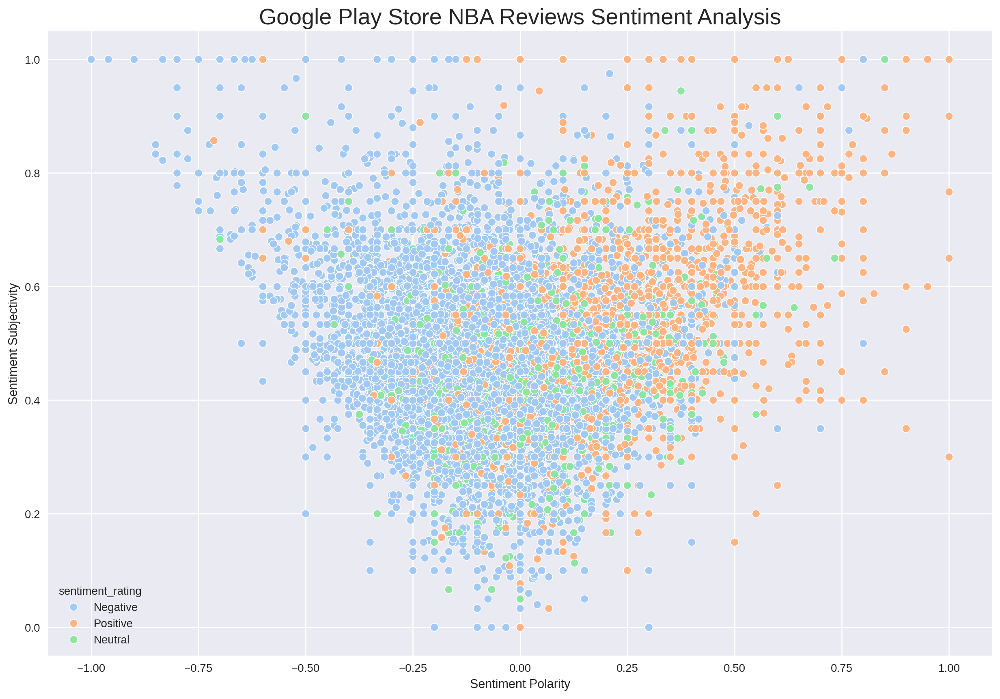

In [ ]:
# Scatter plot untuk sentiment polarity vs sentiment subjectivity
sns.scatterplot(
    x=df_nba['sentiment_polarity'],
    y=df_nba['sentiment_subjective'],
    hue=df_nba['sentiment_rating'],  # Warna berdasarkan sentimen (Positive, Neutral, Negative)
    edgecolor='white',
    palette="pastel"
)

plt.title("Google Play Store NBA Reviews Sentiment Analysis", fontsize=20)
plt.xlabel("Sentiment Polarity")
plt.ylabel("Sentiment Subjectivity")
plt.show()


Dari scatter plot analisis sentimen dari ulasan Halodoc di Google Play Stor didapatkan penjelasan :

- **Sumbu X (sentiment_polarity)**: Menunjukkan polaritas sentimen dari ulasan, dengan nilai berkisar dari -1 (sangat negatif) hingga 1 (sangat positif). Nilai mendekati 0 menunjukkan sentimen netral.

- **Sumbu Y (sentiment_subjective)**: Menunjukkan tingkat subjektivitas dari ulasan, dengan nilai berkisar dari 0 (sangat objektif) hingga 1 (sangat subjektif).

- **Warna Titik (sentiment_rating)**:
  - **Biru (Positive)**: Menunjukkan ulasan dengan sentimen positif.
  - **Oranye (Negative)**: Menunjukkan ulasan dengan sentimen negatif.
  - **Hijau (Neutral)**: Menunjukkan ulasan dengan sentimen netral.


<ipython-input-37-5b746640a338>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=d, x="word", y="count", palette=sns.color_palette("rainbow", n_colors=terms))


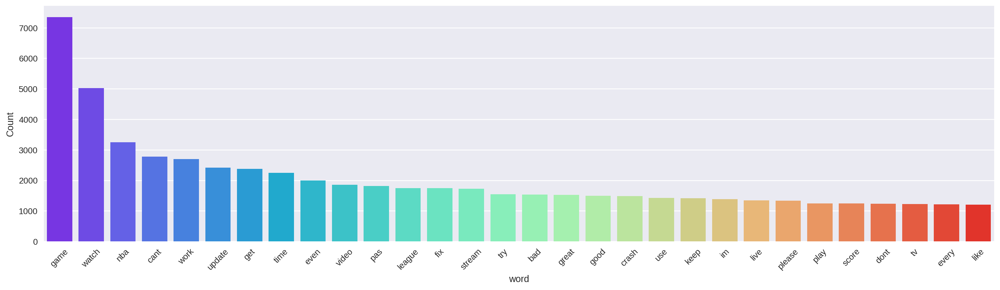

In [ ]:
# Frekuensi kata setelah pembersihan stopwords
freq_words(df_nba['cleaned_content'])

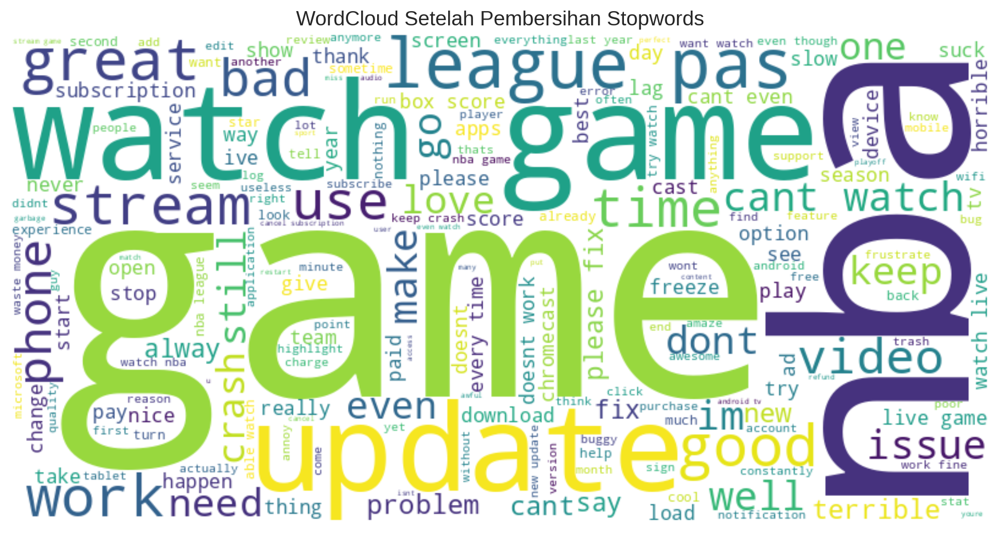

In [ ]:
# Gabungkan semua kata setelah pembersihan stopwords
all_words_after = ' '.join(df_nba['cleaned_content'])

# Buat WordCloud
wordcloud_after = WordCloud(width=800, height=400, background_color='white').generate(all_words_after)

# Plot WordCloud
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud_after, interpolation='bilinear')
plt.axis('off')
plt.title("WordCloud Setelah Pembersihan Stopwords", fontsize=14)
plt.show()

In [ ]:
from collections import Counter
import pandas as pd

def freq_words_top5(text_column, n=5):
    """
    Menghitung n kata paling sering muncul dalam kolom teks.

    Parameters:
        text_column (pd.Series): Kolom teks dalam DataFrame.
        n (int): Jumlah kata teratas yang ingin ditampilkan (default = 5).

    Returns:
        pd.DataFrame: DataFrame dengan kata dan jumlah kemunculannya.
    """
    # Pastikan kolom tidak kosong atau berisi NaN
    text_column = text_column.dropna()

    # Gabungkan semua teks menjadi satu string
    all_words = ' '.join(text_column).split()

    # Hitung jumlah kemunculan setiap kata
    word_counts = Counter(all_words)

    # Konversi ke DataFrame
    words_df = pd.DataFrame({'word': list(word_counts.keys()), 'count': list(word_counts.values())})

    # Ambil n kata dengan frekuensi tertinggi
    top_words = words_df.nlargest(columns="count", n=n)

    return top_words

# Terapkan fungsi pada DataFrame df_nba
top_5_words = freq_words_top5(df_nba['cleaned_content'], n=5)
print(top_5_words)

      word  count
46    game   7350
70   watch   5022
28     nba   3250
24    cant   2782
156   work   2697


In [ ]:
df_nba.to_csv('df_nba.csv', index=False)

## Rating Score

In [ ]:
df_nba['score'].value_counts()

,count
score,
1,8936
5,5246
2,1817
3,1362
4,1285


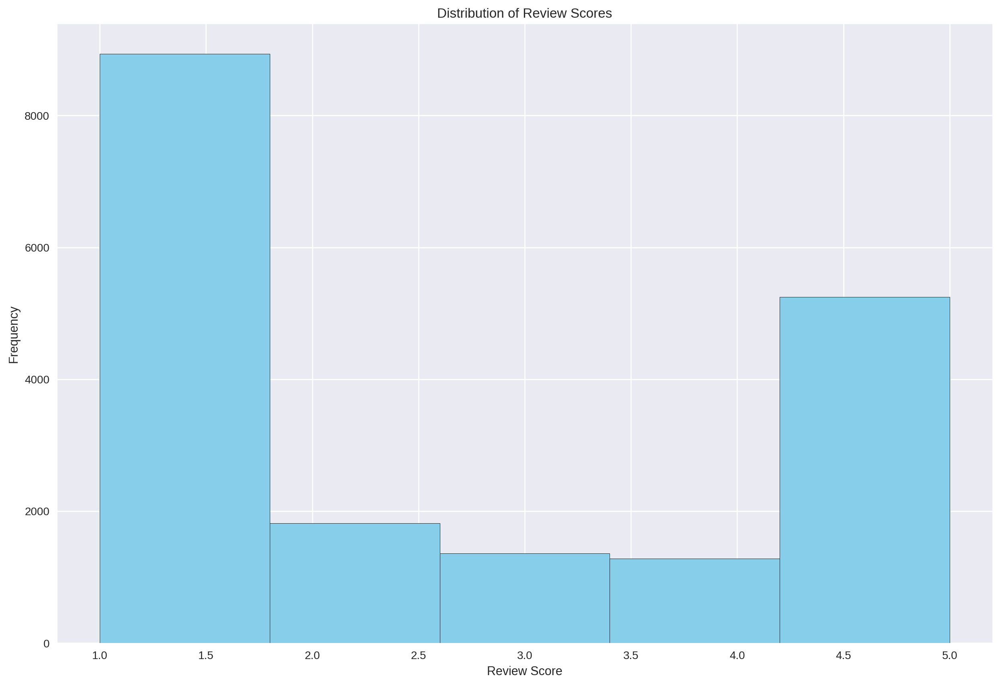

In [ ]:
import matplotlib.pyplot as plt

plt.hist(df_nba['score'], bins=5, color='skyblue', edgecolor='black')
plt.xlabel('Review Score')
plt.ylabel('Frequency')
plt.title('Distribution of Review Scores')
plt.show()


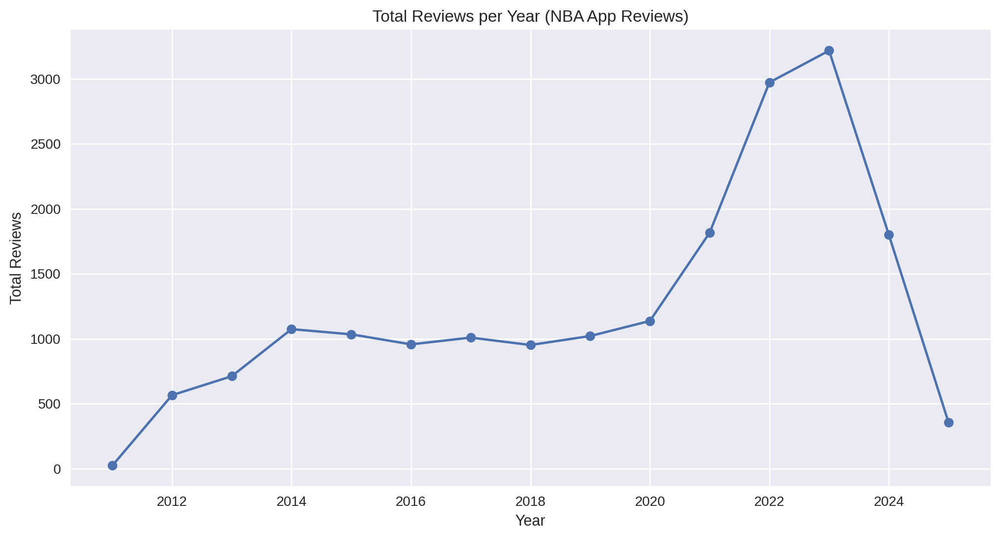

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Konversi kolom 'at' ke format datetime jika belum dalam bentuk datetime
df_nba['at'] = pd.to_datetime(df_nba['at'], errors='coerce')

# Ekstrak tahun dan bulan dari kolom 'at'
df_nba['year'] = df_nba['at'].dt.year
df_nba['month'] = df_nba['at'].dt.month

# Hitung jumlah ulasan per tahun
yearly_reviews = df_nba.groupby('year')['id'].count()

# Hitung jumlah ulasan per tahun dan bulan
monthly_reviews = df_nba.groupby(['year', 'month'])['id'].count()

# Plot jumlah ulasan per tahun
plt.figure(figsize=(12, 6))
plt.plot(yearly_reviews.index, yearly_reviews.values, marker='o', linestyle='-')
plt.xlabel('Year')
plt.ylabel('Total Reviews')
plt.title('Total Reviews per Year (NBA App Reviews)')
plt.grid(True)
plt.show()

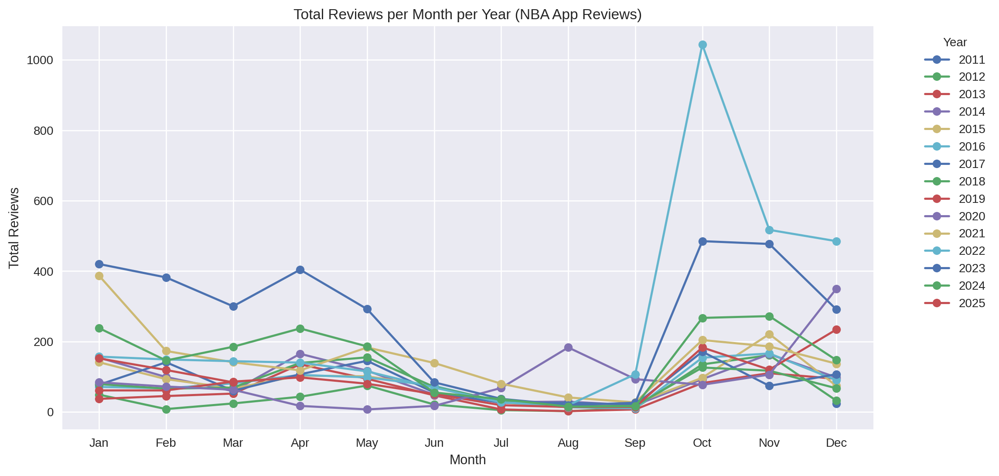

In [ ]:
# Membuat line chart untuk total ulasan per bulan per tahun
plt.figure(figsize=(12, 6))

# Loop untuk setiap tahun yang ada dalam dataset
for year in monthly_reviews.index.get_level_values(0).unique():
    year_data = monthly_reviews.loc[year]  # Ambil data berdasarkan tahun
    plt.plot(year_data.index, year_data.values, marker='o', label=str(year))

plt.xlabel('Month')
plt.ylabel('Total Reviews')
plt.title('Total Reviews per Month per Year (NBA App Reviews)')
plt.legend(title="Year", bbox_to_anchor=(1.05, 1), loc='upper left')  # Tambahkan legenda di sebelah kanan
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])  # Label bulan
plt.grid(True)
plt.show()

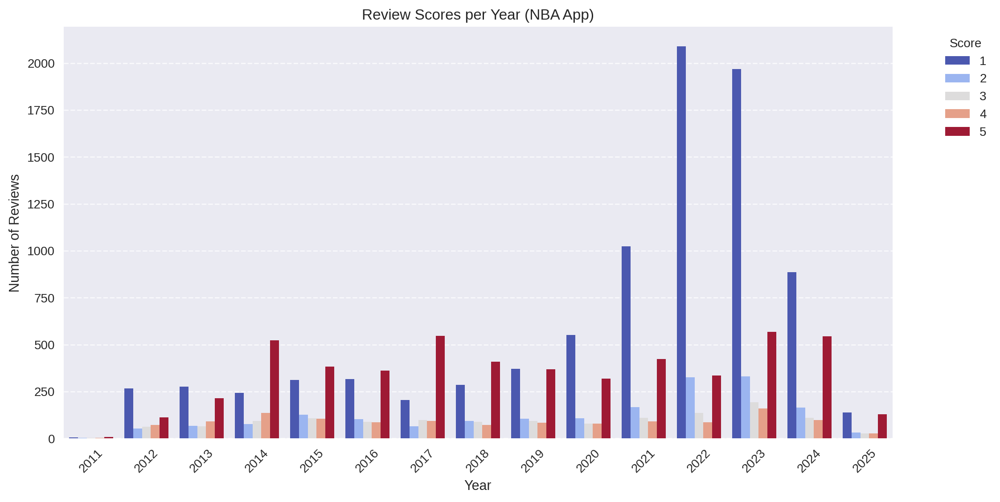

score,1,2,3,4,5
year,,,,,
2011,5,3,3,4,9
2012,267,53,62,72,112
2013,275,67,66,90,214
2014,243,76,94,137,524
2015,312,127,108,105,382
2016,317,102,89,87,362
2017,204,66,99,93,547
2018,286,94,89,73,410
2019,371,105,94,83,368


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan kolom 'at' dalam format datetime
df_nba['at'] = pd.to_datetime(df_nba['at'])

# Ekstrak tahun dari kolom 'at'
df_nba['year'] = df_nba['at'].dt.year

# Kelompokkan data berdasarkan tahun dan score, lalu hitung jumlahnya
score_per_year = df_nba.groupby(['year', 'score'])['id'].count().reset_index()

# Buat bar chart
plt.figure(figsize=(12, 6))
sns.barplot(x='year', y='id', hue='score', data=score_per_year, palette="coolwarm")

# Kustomisasi tampilan grafik
plt.xlabel('Year')
plt.ylabel('Number of Reviews')
plt.title('Review Scores per Year (NBA App)')
plt.legend(title='Score', bbox_to_anchor=(1.05, 1), loc='upper left')  # Letakkan legenda di samping kanan
plt.xticks(rotation=45)  # Rotasi label tahun agar lebih mudah dibaca
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Tambahkan grid horizontal
plt.show()

# DataFrame untuk melihat distribusi score per tahun dalam tabel
score_per_year_df = df_nba.groupby('year')['score'].value_counts().unstack(fill_value=0)
score_per_year_df

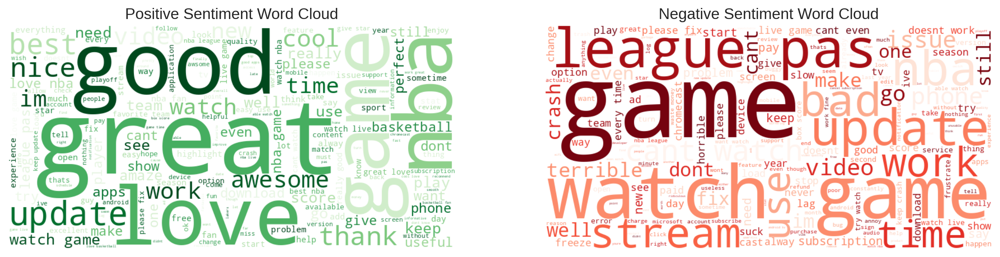

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Memisahkan ulasan positif dan negatif berdasarkan sentiment_rating
positive_reviews = df_nba[df_nba['sentiment_rating'] == 'Positive']['cleaned_content']
negative_reviews = df_nba[df_nba['sentiment_rating'] == 'Negative']['cleaned_content']

# Menggabungkan teks untuk setiap kategori
positive_text = ' '.join(positive_reviews.dropna())  # Drop NaN untuk menghindari error
negative_text = ' '.join(negative_reviews.dropna())

# Membuat wordcloud untuk masing-masing sentimen
positive_wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='Greens').generate(positive_text)
negative_wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='Reds').generate(negative_text)

# Menampilkan wordcloud
plt.figure(figsize=(16, 8))

# Wordcloud Sentimen Positif
plt.subplot(1, 2, 1)
plt.imshow(positive_wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Positive Sentiment Word Cloud", fontsize=14)

# Wordcloud Sentimen Negatif
plt.subplot(1, 2, 2)
plt.imshow(negative_wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Negative Sentiment Word Cloud", fontsize=14)

plt.show()

# ====================================================
# Export Cleaned Data
# - Save the final cleaned DataFrame to CSV
# - Output: nba_reviews_data_done.csv
# ====================================================

In [ ]:
# prompt: save it as a new csv file with a new cleaned name

# Assuming df_nba is your DataFrame
df_nba.to_csv('last_nba_reviews.csv', index=False)


In [ ]:
print(df_nba.columns)

Index(['id', 'content', 'score', 'thumbsUpCount', 'reviewCreatedVersion', 'at',
       'sentiment_polarity', 'sentiment_subjective', 'sentiment_rating',
       'token', 'expanded_content', 'cleaned_content', 'token_after_sr',
       'token_after_lemma', 'token_after_rwr', 'token_after_cwr', 'year',
       'month'],
      dtype='object')


In [ ]:
df_nba[['content','sentiment_rating']].head()


,content,sentiment_polarity,sentiment_subjective,sentiment_rating
0,this app won't allow you to unsubscribe in your league pass. always declining.,0.000000,0.000000,Negative
1,great app! great support team! the new multi view feature is the best way to keep up,0.684091,0.563636,Positive
2,this app is terrible at streaming anywhere other than on the app itself (this goes for streaming it from my laptop to tv too). i literally can't stream this from my phone to the tv.,-1.000000,1.000000,Negative
4,don't like nba nor sports ony here to get 10 points,0.000000,0.000000,Neutral
5,great app,0.800000,0.750000,Positive


In [ ]:
df_nba.to_csv("nba_reviews_data_done.csv", index=False)  # Save all data